In [1]:
import numpy as np
import matplotlib.pyplot as plt 
from preprocess_image import PreprocessImage
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split



In [25]:
df_train = pd.read_csv('test/DataTest.csv', delimiter=';')
df_train = df_train.drop(['Unnamed: 0'], axis=1)
# df_train = df_train.drop([126, 457, 600]) # delete the wrong labeled data
# label_array = df_train['Vehicleregistrationplate'].to_numpy()
path_train = df_train['Name of File'].to_numpy()
# train_path_array, test_path_array, train_label_array, test_label_array = train_test_split(path_train, label_array, test_size=0.2, random_state=42)


In [26]:
def plot_image(images, desc, idx_s, idx_e):
    images = images[idx_s:idx_e]
    num_images = len(images)
    num_columns = 10
    num_rows = np.ceil(num_images / num_columns).astype(int)

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, int(22*(num_rows/num_columns))), dpi=300)

    fig.suptitle(f'{desc}_[{idx_s}:{idx_e-1}]', fontsize=16)  # Main plot title

    for i, ax in enumerate(axes.flatten()):
        if i < num_images:
            img = images[i]
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for proper display
            ax.axis('off')
            ax.set_title(f'Idx: {i+idx_s}')  # Subplot title
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.savefig(f'manual_inspection_test/{desc}_{idx_s}:{idx_e-1}.png', dpi=300) 
    plt.show()

In [28]:
train_image = PreprocessImage(img_paths=path_train, output_pixel=384, padding_ratio=0.9, path_prefix='test', include_original=False)
process = [train_image.bw_image(masked_img=np.array([])), 
           train_image.segment_white(masked_img=np.array([]), img=None), 
           train_image.segment_number_image(masked_img=np.array([])), 
           train_image.gray_image(masked_img=np.array([])), ]
desc = ['bw_image',
        'segment_white',
        'segment_number_image',
        'gray_image']
imgs=[]
for id, proc in enumerate(process):
    imgs.append(proc)
    # plot_image(img, desc[id])
    # print(img.shape)

Preprocess: Convert to Grayscale Image: 100%|██████████| 100/100 [00:00<00:00, 2643.46it/s]


In [29]:
for img in imgs:
    print(img.shape)

(100, 384, 384, 3)
(100, 384, 384, 3)
(100, 384, 384, 3)
(100, 384, 384, 3)


In [30]:
batch_idx = [i for i in range(0, 101, 50)]
# batch_idx.append(637)

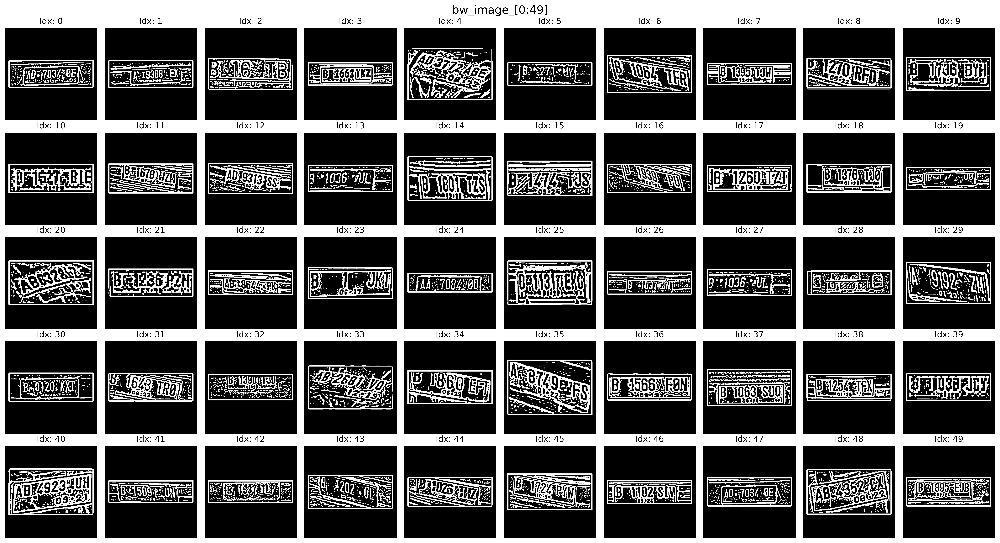

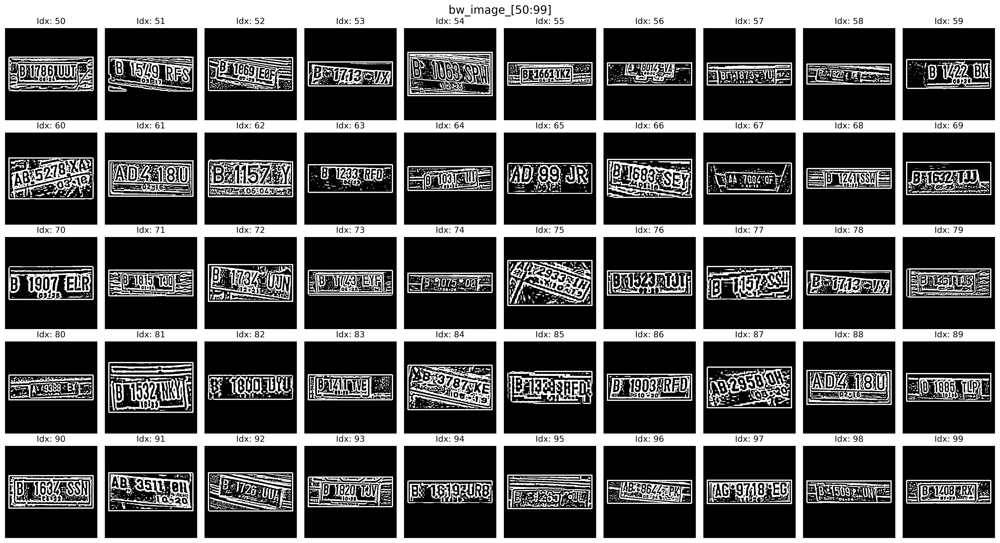

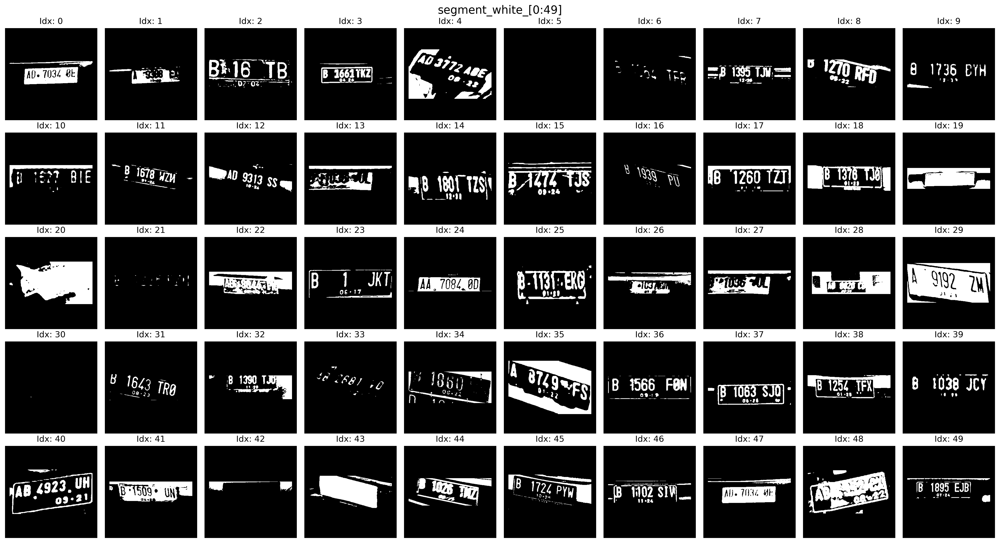

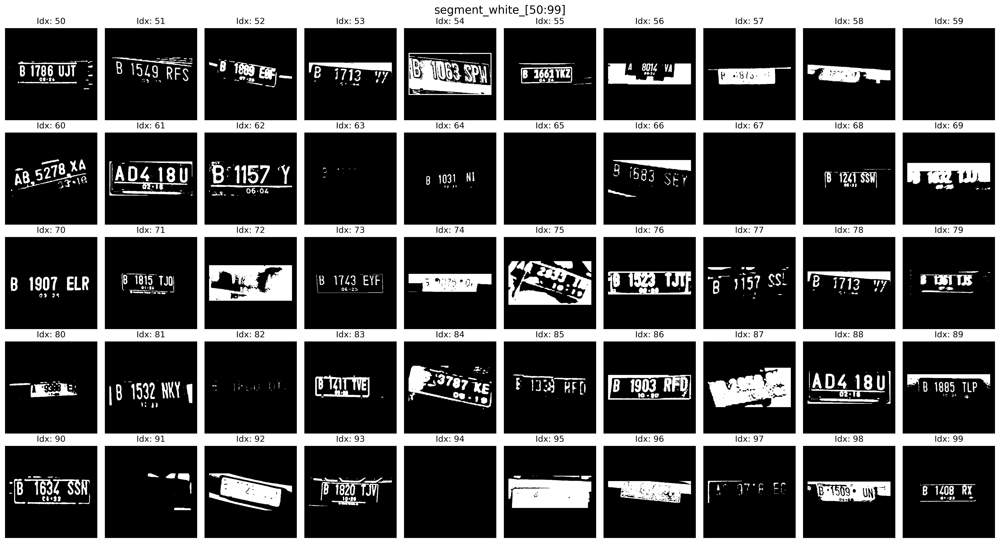

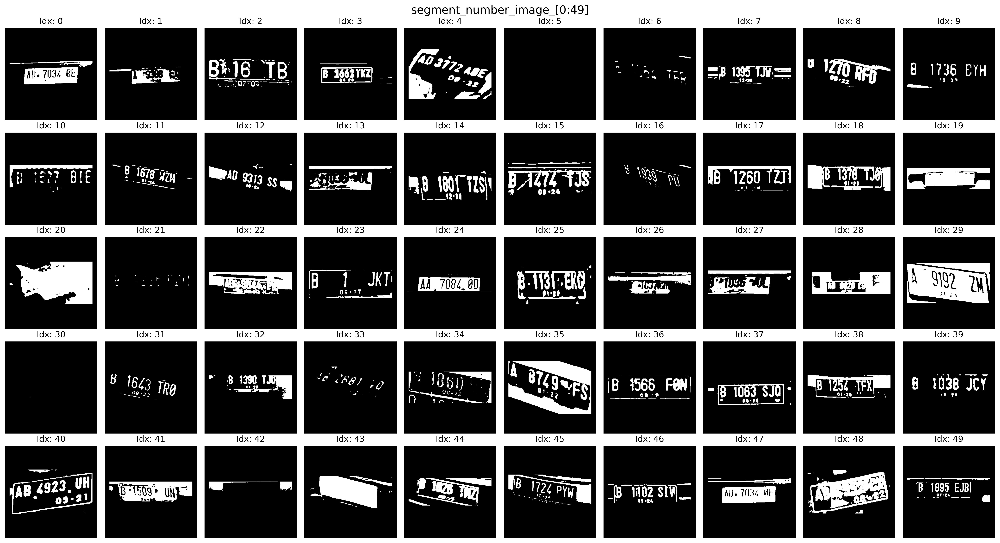

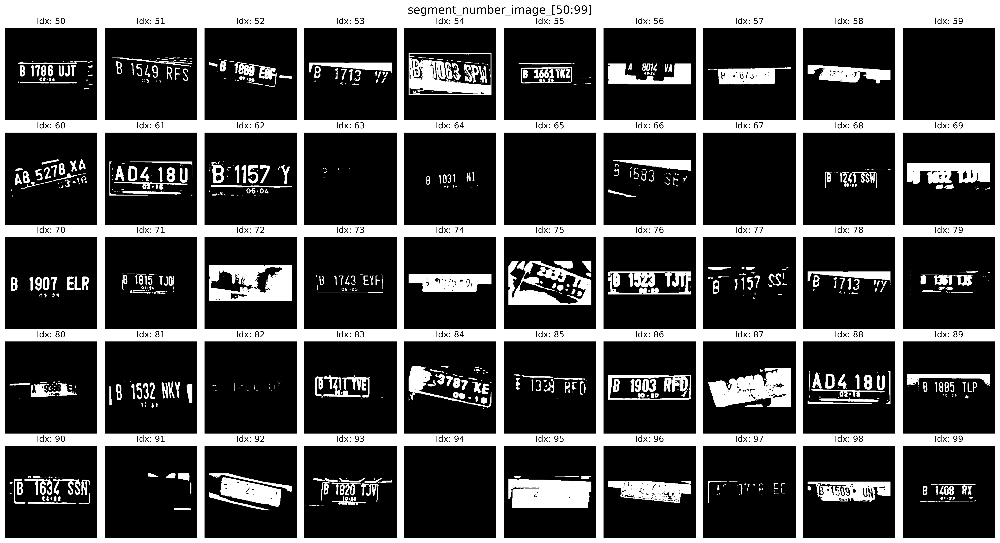

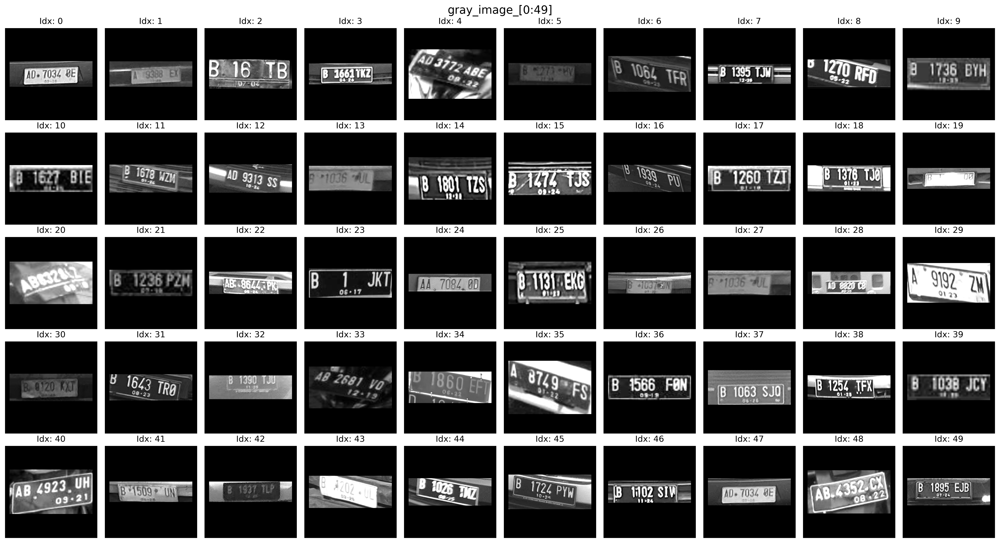

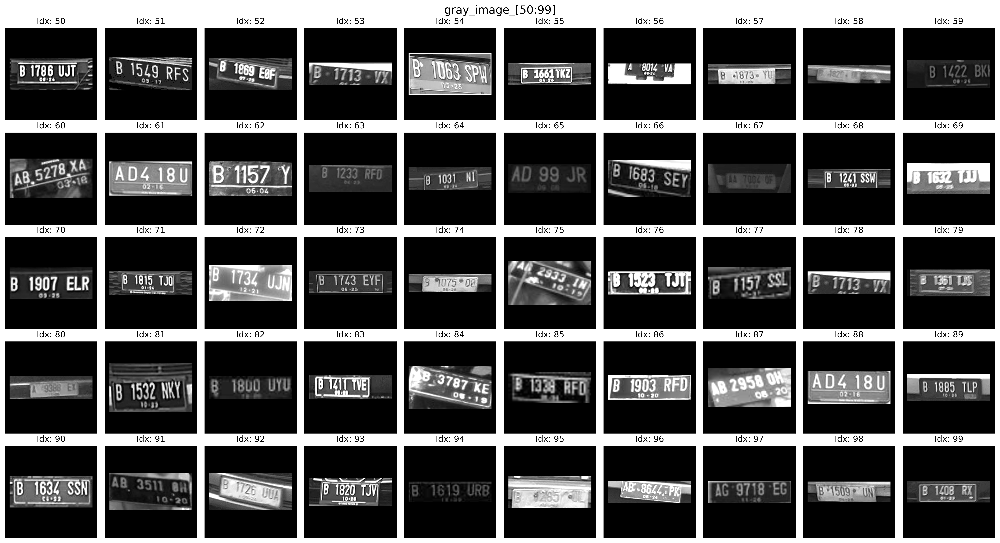

In [31]:
for id, img in enumerate(imgs):
    for idx in range(1, len(batch_idx)):
        plot_image(img, f'{desc[id]}', batch_idx[idx-1], batch_idx[idx])

In [32]:
batch_idx

[0, 50, 100]